In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
pip install opencv-python ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.8/872.8 kB 22.3 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
import cv2
from ultralytics import YOLO

In [2]:
model = YOLO("yolov9c.pt")

100%|██████████| 49.4M/49.4M [00:00<00:00, 314MB/s]


In [3]:
def predict(chosen_model, img, classes=[], conf=0.5):
    if classes:
        results = chosen_model.predict(img, classes=classes, conf=conf)
    else:
        results = chosen_model.predict(img, conf=conf)

    return results

def predict_and_detect(chosen_model, img, classes=[], conf=0.5, rectangle_thickness=2, text_thickness=1):
    results = predict(chosen_model, img, classes, conf=conf)
    for result in results:
        for box in result.boxes:
            cv2.rectangle(img, (int(box.xyxy[0][0]), int(box.xyxy[0][1])),
                          (int(box.xyxy[0][2]), int(box.xyxy[0][3])), (255, 0, 0), rectangle_thickness)
            cv2.putText(img, f"{result.names[int(box.cls[0])]}",
                        (int(box.xyxy[0][0]), int(box.xyxy[0][1]) - 10),
                        cv2.FONT_HERSHEY_PLAIN, 1, (255, 0, 0), text_thickness)
    return img, results

In [6]:
# read the image
image = cv2.imread("/kaggle/input/traffic-vechiles/traffic-vechiles.jpeg")
result_img, _ = predict_and_detect(model, image, classes=[], conf=0.5)


0: 416x640 1 person, 1 car, 4 buss, 3 trucks, 60.6ms
Speed: 2.1ms preprocess, 60.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


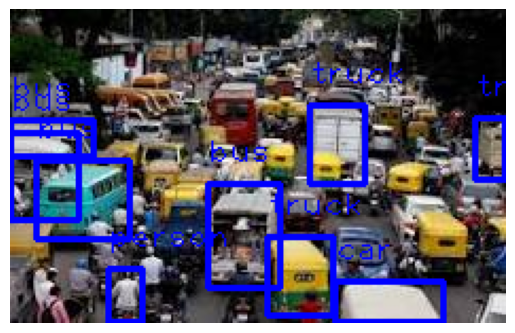

In [7]:
import matplotlib.pyplot as plt



# Convert from BGR to RGB (OpenCV uses BGR by default)
result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(result_img_rgb)
plt.axis('off')  # Hide axes
plt.show()


In [ ]:
video_path = r"/kaggle/input/videos/854745-hd_1280_720_50fps.mp4"
cap = cv2.VideoCapture(video_path)
while True:
    success, img = cap.read()
    if not success:
        break
    result_img, _ = predict_and_detect(model, img, classes=[], conf=0.5)
    #cv2.imshow("Image", result_img)
    
    #cv2.waitKey(1)
    plt.imshow(result_img)
    plt.axis('off')  # Hide axes
    plt.show()


In [13]:
# defining function for creating a writer (for mp4 videos)
def create_video_writer(video_cap, output_filename):
    # grab the width, height, and fps of the frames in the video stream.
    frame_width = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(video_cap.get(cv2.CAP_PROP_FPS))
    # initialize the FourCC and a video writer object
    fourcc = cv2.VideoWriter_fourcc(*'mpv4')
    writer = cv2.VideoWriter(output_filename, fourcc, fps,
                             (frame_width, frame_height))
    return writer


0: 384x640 11 cars, 1 motorcycle, 19.3ms
Speed: 2.5ms preprocess, 19.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


OpenCV: FFMPEG: tag 0x3476706d/'mpv4' is not found (format 'mp4 / MP4 (MPEG-4 Part 14)')'


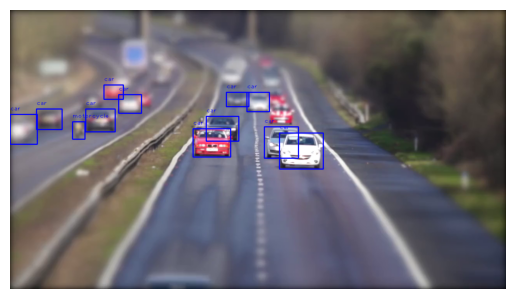


0: 384x640 12 cars, 1 motorcycle, 20.1ms
Speed: 2.2ms preprocess, 20.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


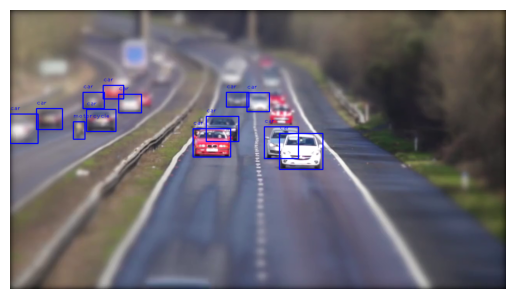


0: 384x640 10 cars, 1 motorcycle, 19.8ms
Speed: 1.7ms preprocess, 19.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


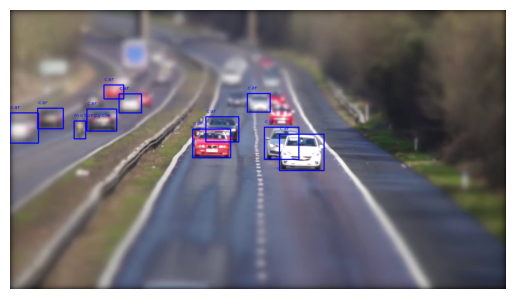


0: 384x640 10 cars, 1 motorcycle, 20.2ms
Speed: 2.2ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


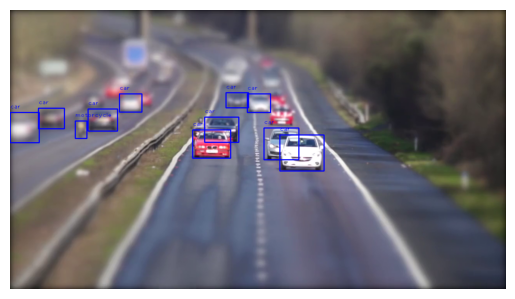


0: 384x640 11 cars, 1 motorcycle, 20.2ms
Speed: 2.1ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


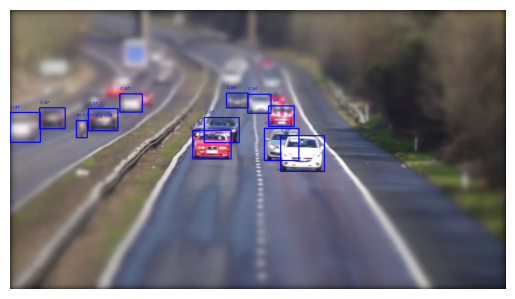


0: 384x640 11 cars, 20.2ms
Speed: 2.2ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


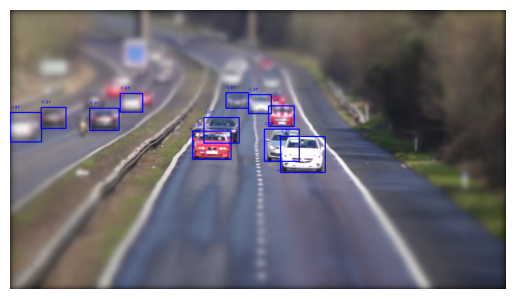


0: 384x640 11 cars, 1 motorcycle, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


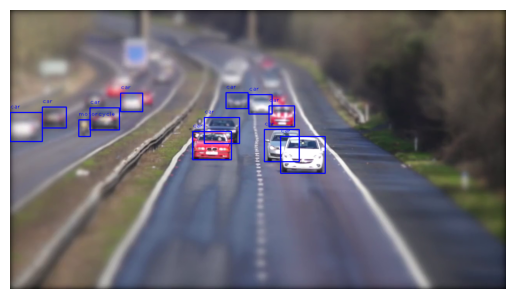


0: 384x640 11 cars, 1 motorcycle, 19.6ms
Speed: 1.9ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


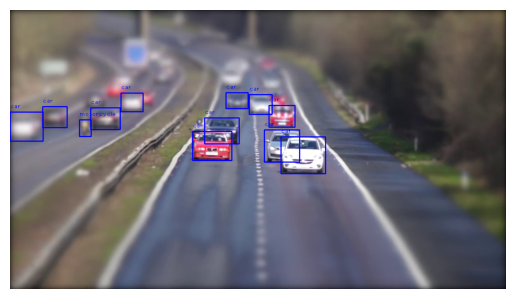


0: 384x640 11 cars, 1 motorcycle, 19.7ms
Speed: 2.2ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


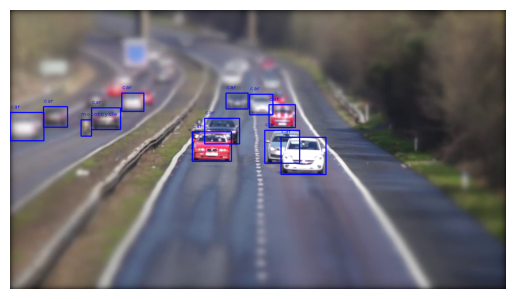


0: 384x640 11 cars, 19.8ms
Speed: 2.3ms preprocess, 19.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


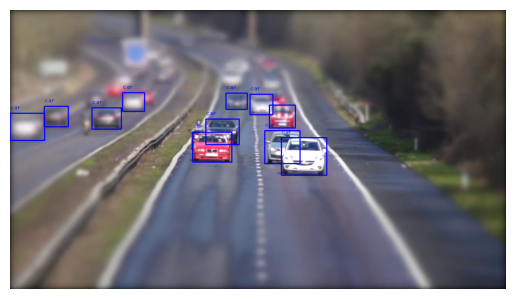


0: 384x640 11 cars, 20.8ms
Speed: 1.9ms preprocess, 20.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


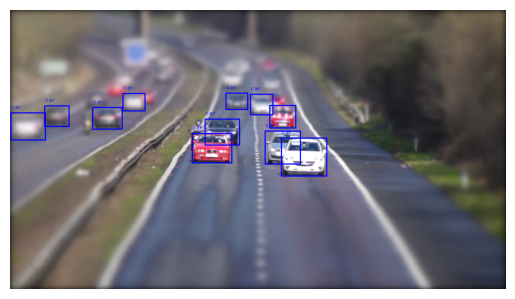


0: 384x640 11 cars, 20.5ms
Speed: 2.3ms preprocess, 20.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


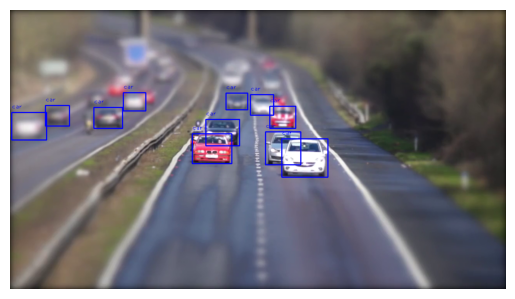


0: 384x640 11 cars, 19.8ms
Speed: 1.9ms preprocess, 19.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


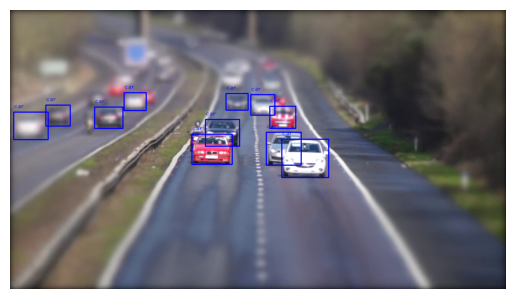


0: 384x640 11 cars, 19.6ms
Speed: 1.9ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


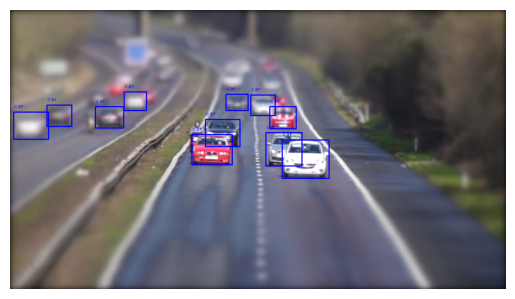


0: 384x640 11 cars, 20.0ms
Speed: 2.2ms preprocess, 20.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


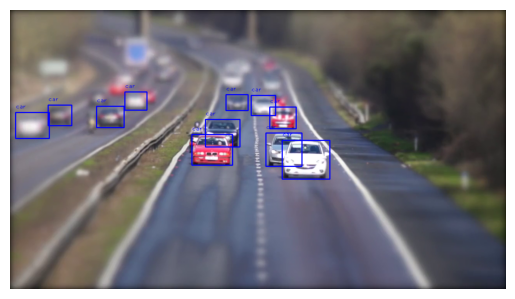


0: 384x640 12 cars, 20.0ms
Speed: 2.3ms preprocess, 20.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


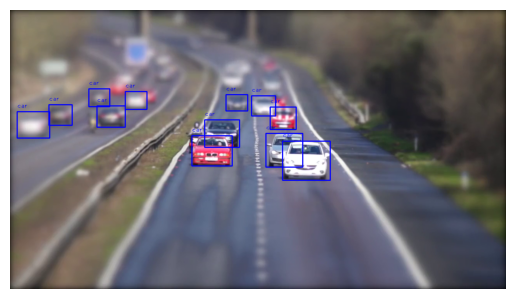


0: 384x640 12 cars, 19.7ms
Speed: 2.2ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


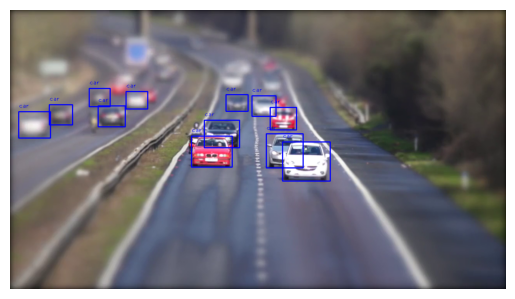


0: 384x640 11 cars, 19.6ms
Speed: 2.0ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


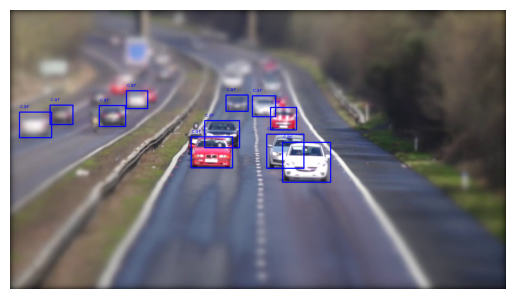


0: 384x640 11 cars, 19.6ms
Speed: 1.9ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


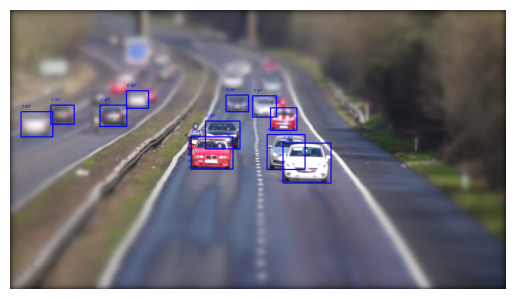


0: 384x640 12 cars, 19.0ms
Speed: 1.7ms preprocess, 19.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


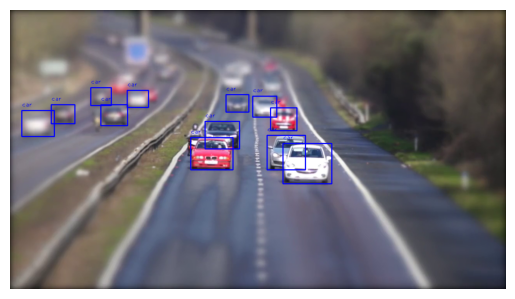


0: 384x640 12 cars, 19.6ms
Speed: 2.1ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


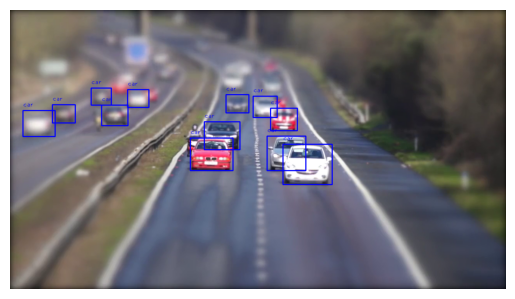


0: 384x640 10 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


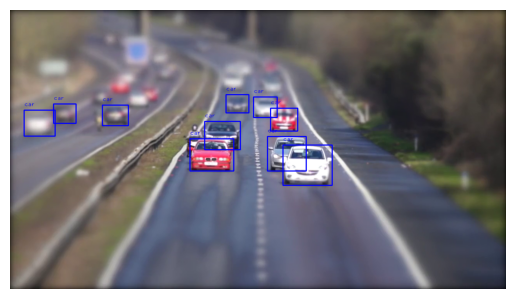


0: 384x640 10 cars, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


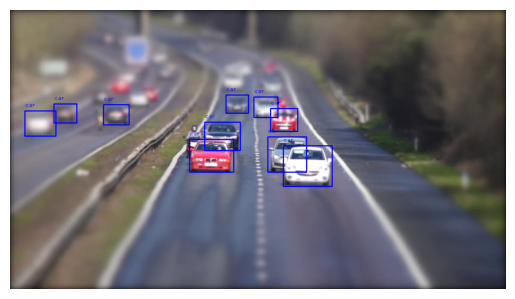


0: 384x640 10 cars, 19.6ms
Speed: 1.9ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


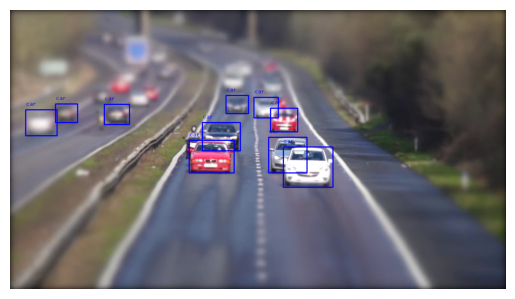


0: 384x640 10 cars, 19.7ms
Speed: 2.1ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


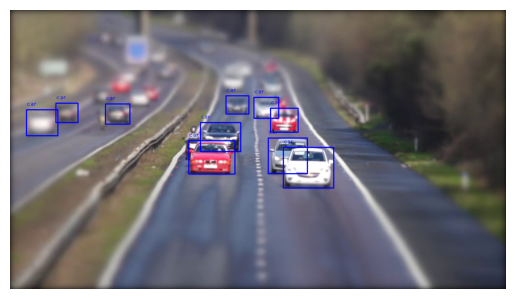


0: 384x640 10 cars, 19.6ms
Speed: 2.1ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


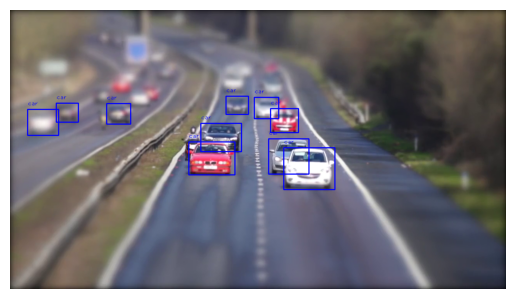


0: 384x640 10 cars, 19.6ms
Speed: 2.0ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


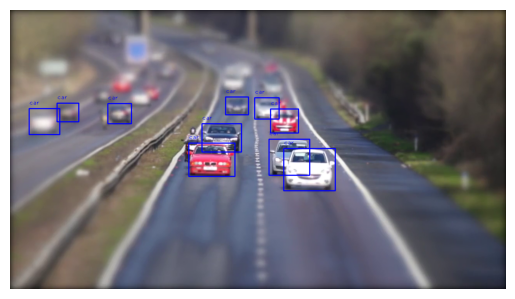


0: 384x640 11 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


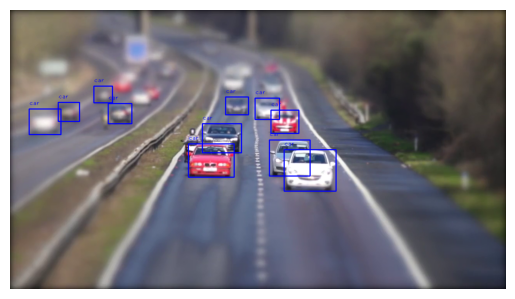


0: 384x640 10 cars, 19.7ms
Speed: 1.6ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


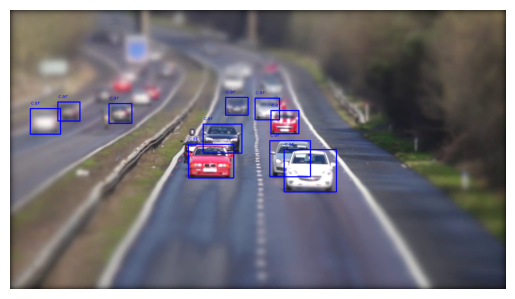


0: 384x640 10 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


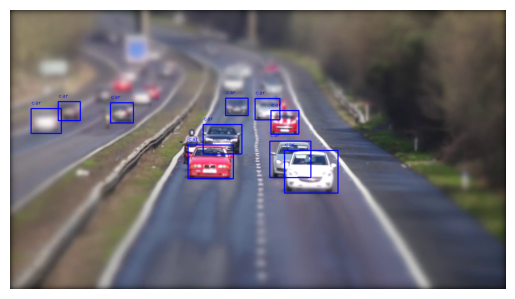


0: 384x640 10 cars, 1 motorcycle, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


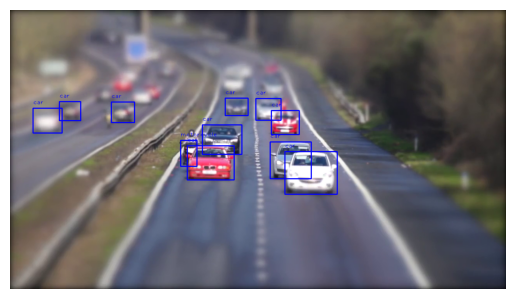


0: 384x640 10 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


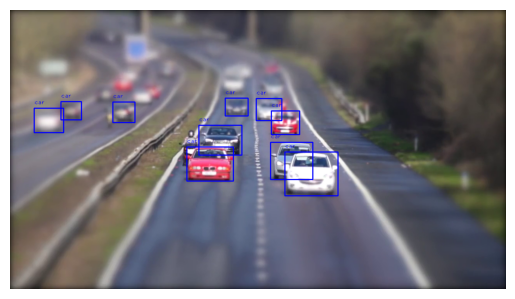


0: 384x640 10 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


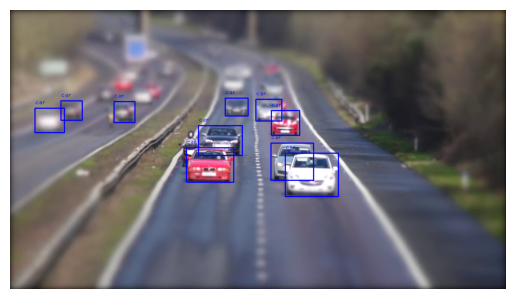


0: 384x640 9 cars, 19.8ms
Speed: 2.2ms preprocess, 19.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


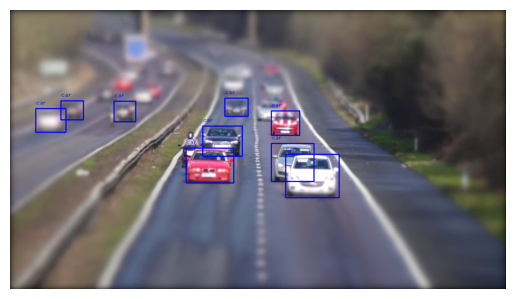


0: 384x640 10 cars, 20.1ms
Speed: 2.3ms preprocess, 20.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


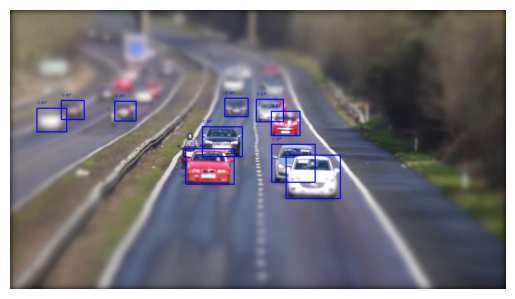


0: 384x640 10 cars, 19.6ms
Speed: 1.7ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


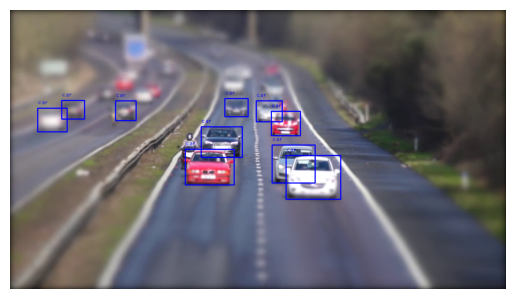


0: 384x640 10 cars, 19.5ms
Speed: 1.9ms preprocess, 19.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


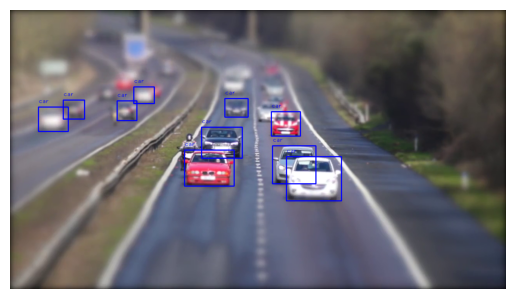


0: 384x640 8 cars, 19.6ms
Speed: 1.7ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


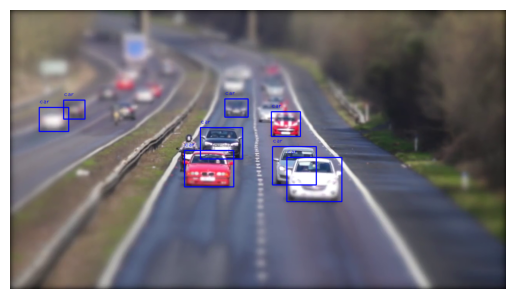


0: 384x640 8 cars, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


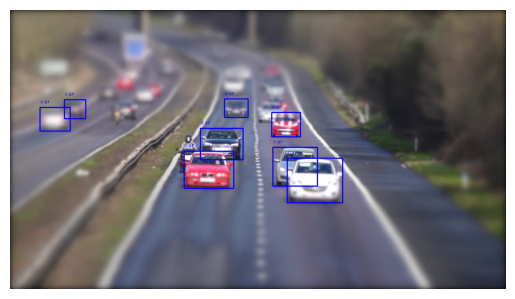


0: 384x640 9 cars, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


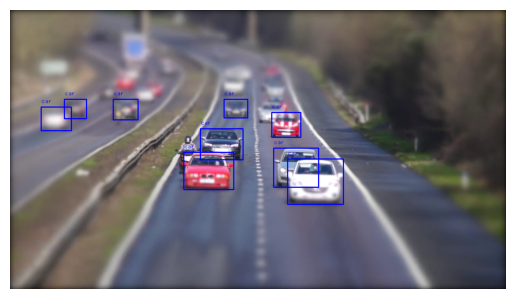


0: 384x640 9 cars, 19.8ms
Speed: 2.1ms preprocess, 19.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


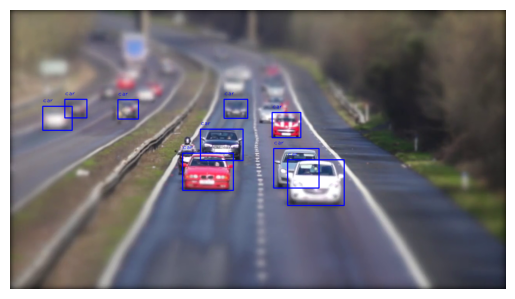


0: 384x640 9 cars, 19.6ms
Speed: 2.1ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


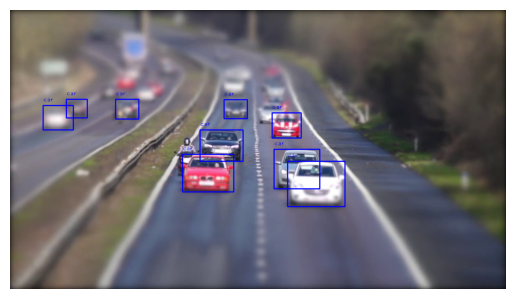


0: 384x640 8 cars, 20.2ms
Speed: 2.1ms preprocess, 20.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


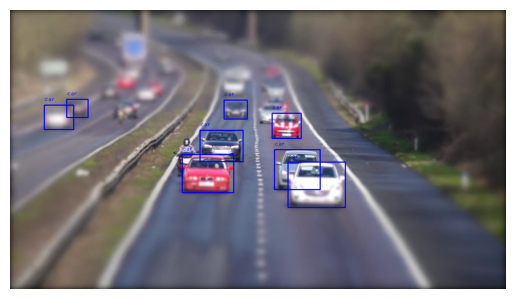


0: 384x640 10 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


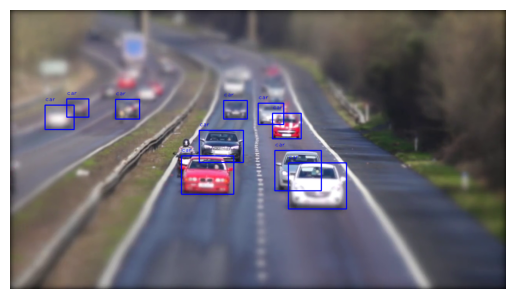


0: 384x640 9 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


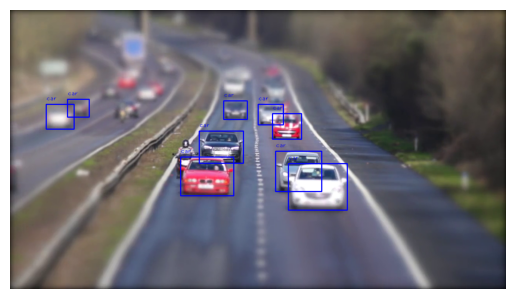


0: 384x640 9 cars, 1 motorcycle, 19.6ms
Speed: 2.1ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


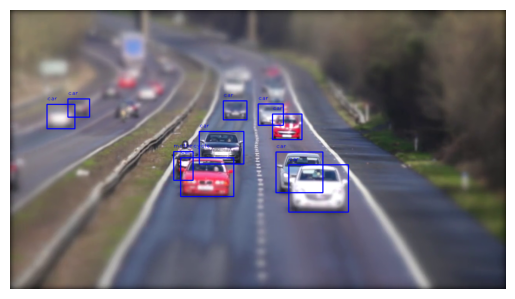


0: 384x640 9 cars, 20.2ms
Speed: 2.2ms preprocess, 20.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


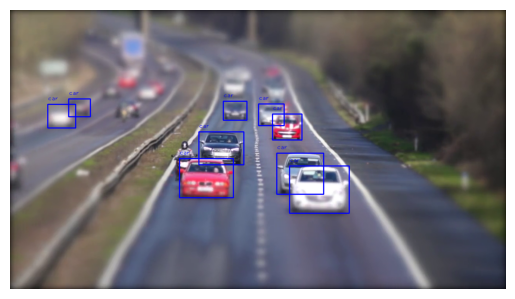


0: 384x640 10 cars, 19.7ms
Speed: 2.0ms preprocess, 19.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


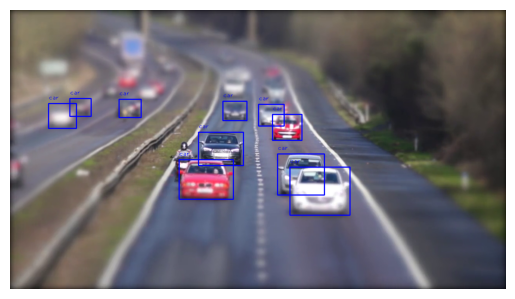


0: 384x640 11 cars, 20.4ms
Speed: 2.2ms preprocess, 20.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


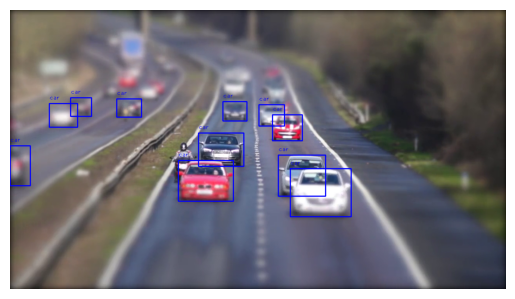


0: 384x640 10 cars, 19.7ms
Speed: 2.0ms preprocess, 19.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


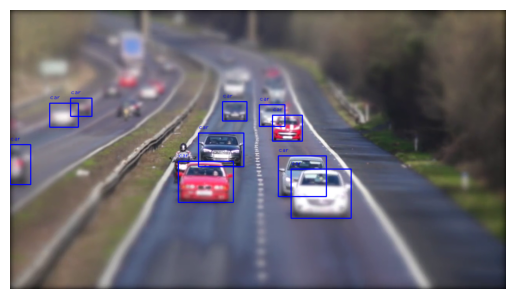


0: 384x640 10 cars, 20.2ms
Speed: 2.1ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


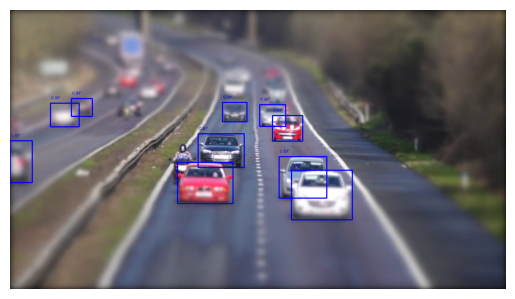


0: 384x640 1 person, 10 cars, 19.7ms
Speed: 2.0ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


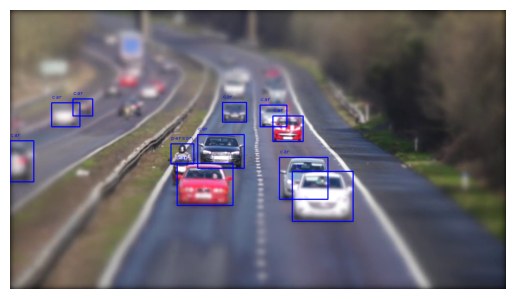


0: 384x640 10 cars, 20.1ms
Speed: 2.5ms preprocess, 20.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


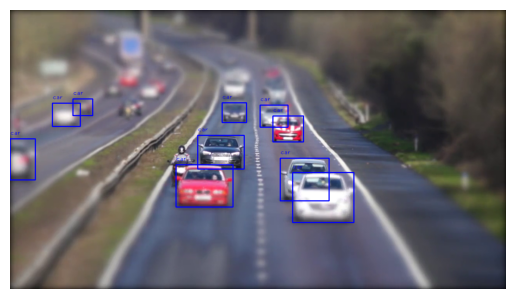


0: 384x640 1 person, 11 cars, 20.1ms
Speed: 2.3ms preprocess, 20.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


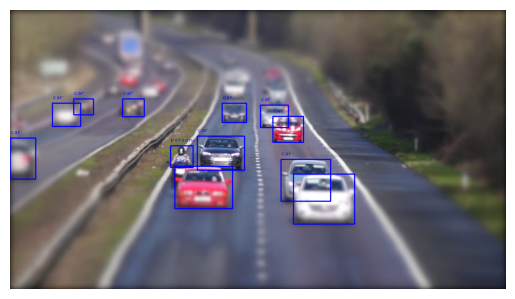


0: 384x640 1 person, 9 cars, 19.7ms
Speed: 2.2ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


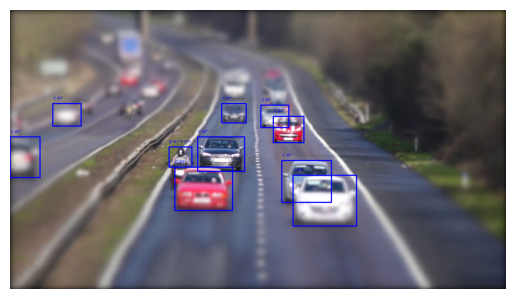


0: 384x640 11 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


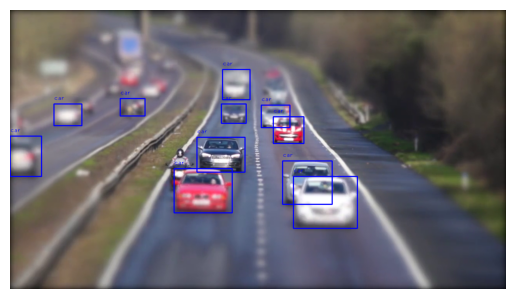


0: 384x640 10 cars, 23.6ms
Speed: 2.2ms preprocess, 23.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


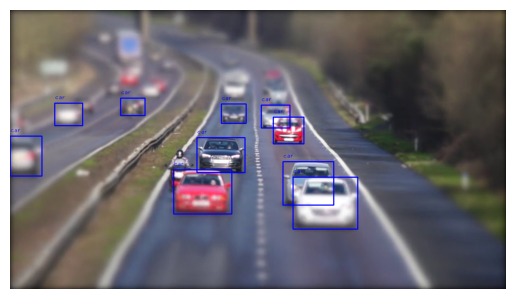


0: 384x640 1 person, 10 cars, 1 motorcycle, 19.6ms
Speed: 2.1ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


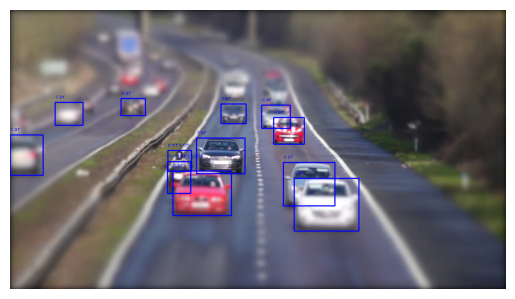


0: 384x640 10 cars, 20.9ms
Speed: 2.1ms preprocess, 20.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


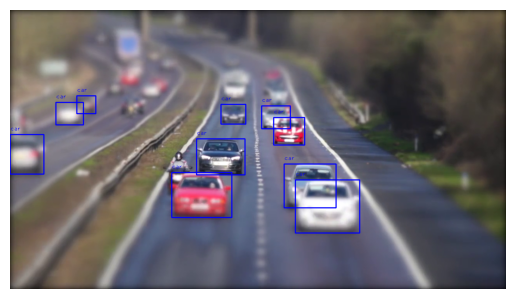


0: 384x640 9 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


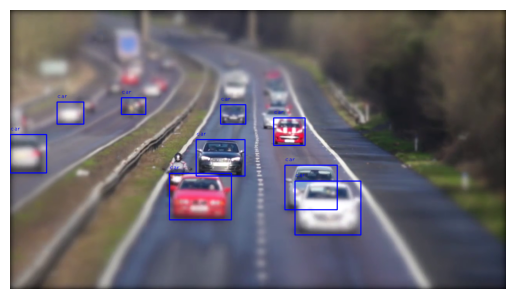


0: 384x640 10 cars, 19.5ms
Speed: 2.1ms preprocess, 19.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


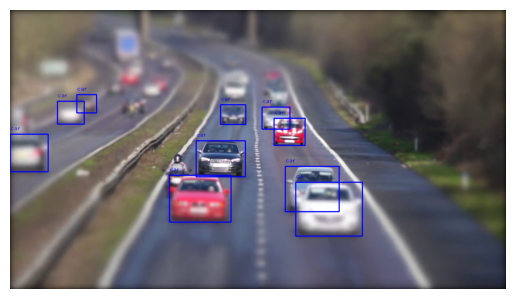


0: 384x640 9 cars, 20.3ms
Speed: 2.2ms preprocess, 20.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


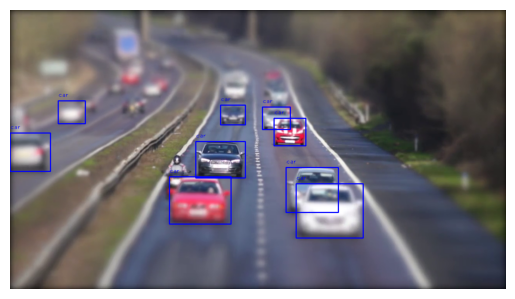


0: 384x640 9 cars, 19.9ms
Speed: 2.1ms preprocess, 19.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


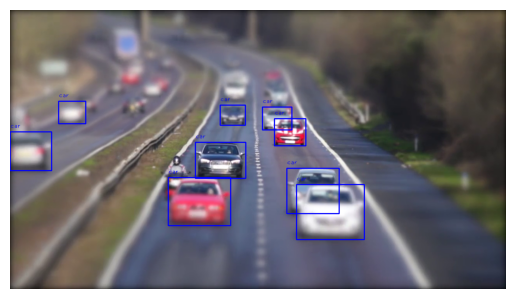


0: 384x640 9 cars, 20.3ms
Speed: 2.2ms preprocess, 20.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


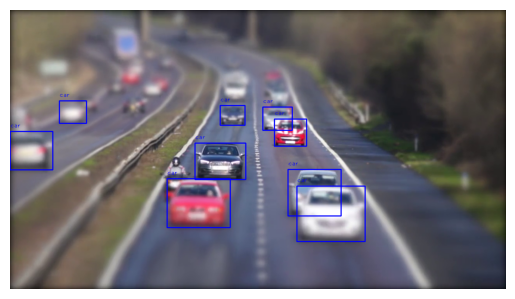


0: 384x640 9 cars, 20.2ms
Speed: 2.2ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


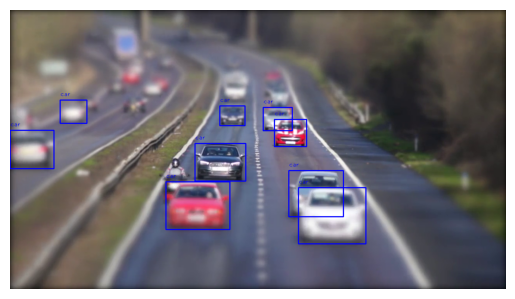


0: 384x640 8 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


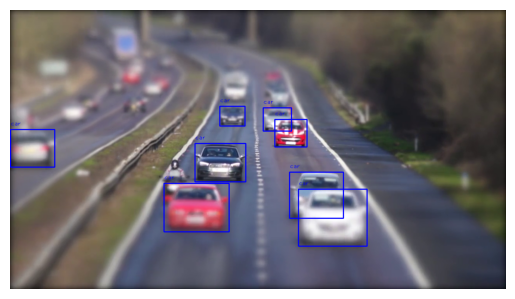


0: 384x640 9 cars, 19.7ms
Speed: 2.0ms preprocess, 19.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


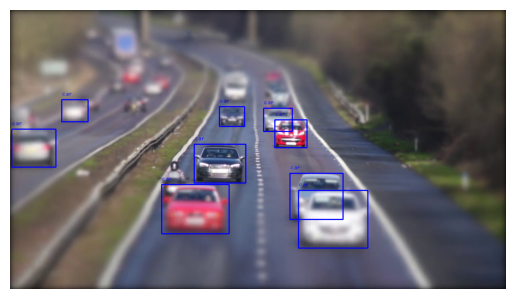


0: 384x640 9 cars, 19.9ms
Speed: 1.8ms preprocess, 19.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


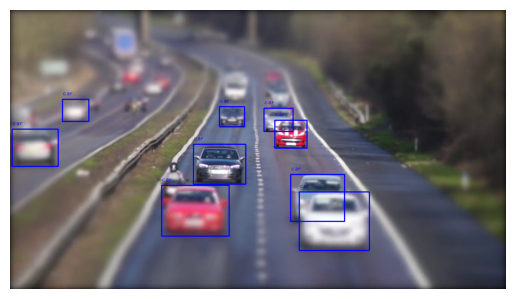


0: 384x640 9 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


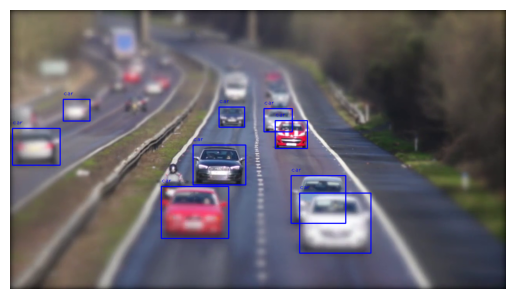


0: 384x640 9 cars, 19.7ms
Speed: 2.1ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


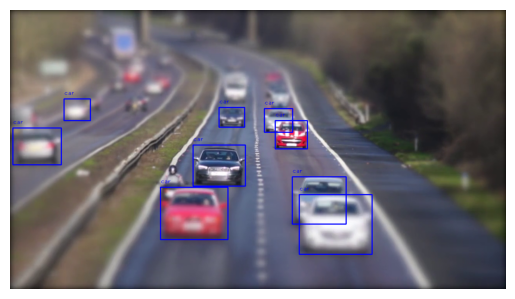


0: 384x640 9 cars, 19.4ms
Speed: 1.9ms preprocess, 19.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


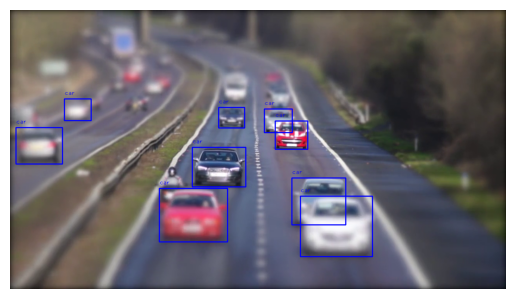


0: 384x640 8 cars, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


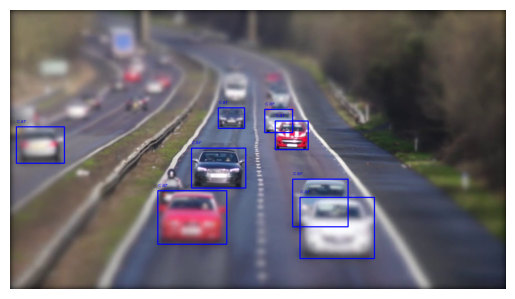


0: 384x640 8 cars, 19.6ms
Speed: 1.7ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


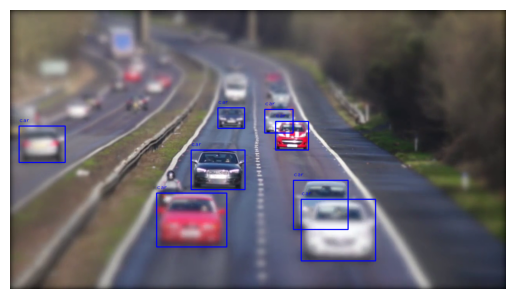


0: 384x640 8 cars, 21.4ms
Speed: 1.7ms preprocess, 21.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


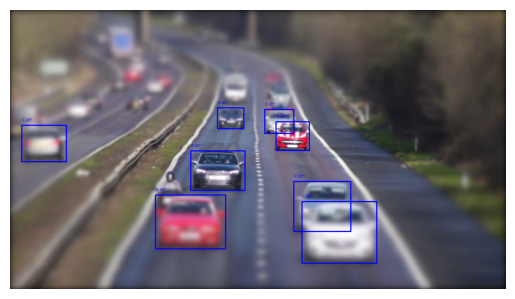


0: 384x640 8 cars, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


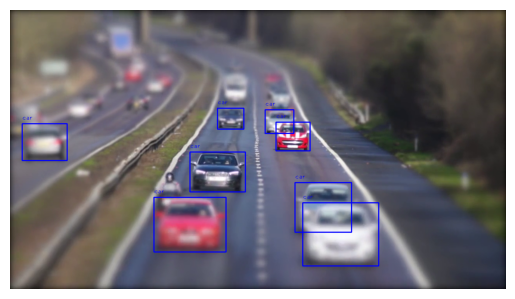


0: 384x640 8 cars, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


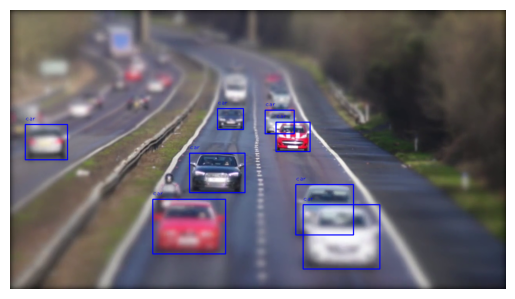


0: 384x640 8 cars, 19.4ms
Speed: 1.9ms preprocess, 19.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


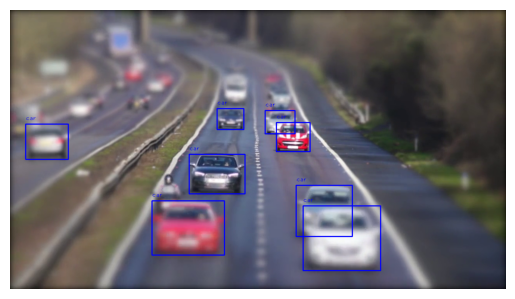


0: 384x640 8 cars, 20.1ms
Speed: 2.1ms preprocess, 20.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


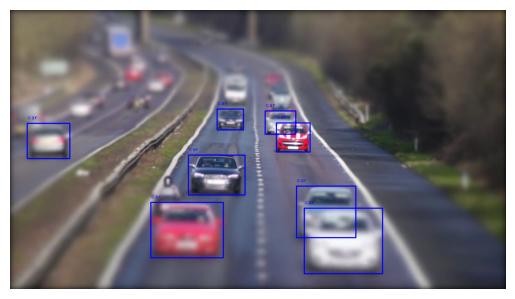


0: 384x640 9 cars, 19.7ms


In [ ]:
# Initialize video capture and writer
video_path = r"/kaggle/input/videos/854745-hd_1280_720_50fps.mp4"
cap = cv2.VideoCapture(video_path)
output_filename = "YourFilename.mp4"
writer = create_video_writer(cap, output_filename)

frame_count = 0
max_frames = 100

while True:
    success, img = cap.read()
    if not success or frame_count >= max_frames:
        break
    
    result_img, _ = predict_and_detect(model, img, classes=[], conf=0.5)
    writer.write(result_img)
    
    # Convert BGR to RGB for matplotlib
    result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(result_img_rgb)
    plt.axis('off')  # Hide axes
    plt.show()
    
    frame_count += 1

writer.release()
cap.release()